# Music Classification Mini-Project:

A client has requested us to build a composer classifier that will determine if audio is composed by one of our known composers, or an unknown composer.
The model will take as input live captured audio that can be 15, 30, or 60-second intervals, as desired.
For this project, the client has collected and annotated several hundred audio files and have saved them as simple midi files.
The provided PS1 Folder contains the known midi files pertaining to four (4) composers: Bach, Beethoven, Schubert, and Brahms.

### Goal:

The goal of this project is to develop a classifier/pipeline that is able to determine which midi files in the provided
PS2 folder are not written by the four (4) composers above (it is a small number).

### Details:

In the interest of time, 30-seconds is the desired default setting.
Analysis of how data quantity effects performance is not expected, but will highlight important client requirements.

The midi files contain additional information that may not be available at inference time; ensure that your algorithm can support this.

The name of the file before the first underscore is the composition name.

The attached dataset is provided in midi format and taken from Musicnet (https://arxiv.org/pdf/1611.09827.pdf).

Optimal model performance is not expected, and neither is the use of the entire dataset and information.
Classical ML approach(es) are recommended as the main form of analysis as setting up a thorough pipeline will be evaluated
by the client more favorably than a poorly implemented state-of-the-art model that is not well-validated or documented.
A deep learning approach may be attempted based on results to showcase additional capabilities.

The client exercise is geared towards a truncated, real-world scenario, demonstrating:
1. Efficacy: How fast you can build solutions and the quantity of analysis shown;
2. Quality: How well you showcase your understanding of the problem, data, and code;
3. Robustness: The completeness of your analysis flow and the robustness of the validation process.

In particular, the client will consider
- overall problem understanding and set up of the analysis
- the completeness of your EDA and model building/tuning/validation
- result interpretation and analysis approach and outcomes
- code quality and completeness
- final conclusions and recommendations based on the brief sprint


## My notes

Without a labeled test dataset, this binary classification is actually an **anomaly detection** problem.
This means we must learn the training set distribution and then use that to detect the outliers in the test set.

There are a few main ways to go about this:
1. **One-class classification**: train a classifier on the training set
2. **Clustering**: cluster the training set
3. **Density estimation**: estimate the probability density function of the training set

There are a few ways to go about each of these.
In the interest of time, I will use a CNN as a composer classifier on the training set.
I've had success with this in the past in a different domain, so I'm hoping it will work here as well.

<br>

### General approach idea:
1. Get midi data into a format that can be used by a CNN.
I will use the PrettyMIDI piano roll feature to make an array of the midi notes and velocities,
and add channels for additional features.
2. Train a CNN on the training set to classify composers with cross-entropy loss.
3. Use the trained CNN to predict the composer of each midi file in the test set.
4. For test losses below a certain threshold, we can assume the piece was composed by one of the known composers.

To validate model/algorithm selection, we can hold out one of the known composers and see how it performs.
I probably won't have time for this.



In [1]:
# Imports

import os
import typing as T
from pathlib import Path
from collections import defaultdict
from pprint import pprint
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pretty_midi as pm
import torch as th
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.distributions import Categorical
from sklearn.utils.class_weight import compute_class_weight
from tqdm import tqdm
import IPython.display as ipd
from torch.utils.tensorboard import SummaryWriter

## Checking out data

In [2]:
data_dir = Path('Part One Data')
[f.name for f in data_dir.iterdir() if not f.name.startswith('.')]

['Part1(PS1)', 'Part1(PS2)']

In [3]:
def is_midi_file(f: Path) -> bool:
	return f.name.endswith('.mid')

train_dir = data_dir / 'Part1(PS1)'
test_dir = data_dir / 'Part1(PS2)'

train_dirs = [f for f in train_dir.iterdir() if not f.name.startswith('.')]
known_composers = [f.name for f in train_dirs]
print("Known composers:", known_composers)
for composer in train_dirs:
	print(f"Number of {composer.name} files:", len([f for f in composer.iterdir() if is_midi_file(f)]))
all_training_files = [f for f in train_dir.rglob('*.mid') if is_midi_file(f)]

print()
test_files = [f for f in test_dir.iterdir() if is_midi_file(f)]
print("Number of test files:", len(test_files), end='\n\n')

Known composers: ['Bach', 'Brahms', 'Schubert', 'Beethoven']
Number of Bach files: 17
Number of Brahms files: 20
Number of Schubert files: 25
Number of Beethoven files: 132

Number of test files: 35



In [4]:
# Functions to get midi data from files

def get_midi_data(midi_file: Path) -> pm.PrettyMIDI:
	"""Get PrettyMIDI object from a file path"""
	if not is_midi_file(midi_file):
		raise ValueError(f"File {midi_file} is not a midi file")

	with midi_file.open('rb') as fd:
		midi_data = pm.PrettyMIDI(fd)
		return midi_data

def get_midi_info_all(midi_file: Path):
	midi_data = get_midi_data(midi_file)
	instruments = midi_data.instruments
	notes = []
	for instrument in instruments:
		notes.extend(instrument.notes)
	notes = sorted(notes, key=lambda x: x.start)
	notes = np.array([[note.start, note.end, note.pitch, note.velocity] for note in notes])
	return notes

In [5]:
### Get extra info from midi files besides just notes
# Example:
tmp_mid = list(train_dirs[0].iterdir())[0]
midi_data = get_midi_data(tmp_mid)
print("Instruments:")
pprint([instr.name for instr in midi_data.instruments])
print()

print("Tempo changes (time, tempo):")
tempo_changes = midi_data.get_tempo_changes()
pprint(list(zip(*midi_data.get_tempo_changes())))
print()

print("Time signature changes (time, numerator, denominator):")
time_sig_changes = midi_data.time_signature_changes
pprint([(time_sig.time, time_sig.numerator, time_sig.denominator) for time_sig in time_sig_changes])
print()

print("Key signature changes (time, key number, scale mode):")
key_sig_changes = midi_data.key_signature_changes
pprint([(key_sig.time, pm.key_number_to_key_name(key_sig.key_number)) for key_sig in key_sig_changes])
print()


Instruments:
['Solo Cello',
 '--------------------------------------',
 'Johann Sebastian Bach  (1685-1750)',
 'Six Suites for Solo Cello']

Tempo changes (time, tempo):
[(0.0, 250.0),
 (0.72, 167.9999328000269),
 (239.64866700000002, 83.99996640001345)]

Time signature changes (time, numerator, denominator):
[(0.0, 4, 4)]

Key signature changes (time, key number, scale mode):
[(0.0, 'Eb Major')]



#### Let's check if those values are usable!
1. Does every file have these features (including test files)?
2. Do they have any correlation with the composer?
3. How will we represent them if so?

In [6]:
def time_signature_str(time_sig: pm.TimeSignature) -> str:
	return f"{time_sig.numerator}/{time_sig.denominator}"

def get_midi_info_df(midi_file: Path, file_index: int = None):
	"""Make a dataframe of midi info for a file"""
	midi_data = get_midi_data(midi_file)
	instruments = midi_data.instruments
	instrument_dict = defaultdict(list)

	for instrument in instruments:
		instrument_dict[instrument].extend(instrument.notes)
	for instrument, notes in instrument_dict.items():
		instrument_dict[instrument] = sorted(instrument_dict[instrument], key=lambda x: x.start)
		instrument_dict[instrument] = np.array([[note.start, note.end, note.pitch, note.velocity] for note in notes])

	df = pd.DataFrame(columns=['instrument', 'start', 'end', 'pitch', 'velocity'])
	for instrument, notes in instrument_dict.items():
		df = pd.concat([df, pd.DataFrame(notes, columns=['start', 'end', 'pitch', 'velocity'])])
		df['instrument'] = instrument.name if instrument.name else instrument.program
		if not instrument.name:
			print(f"Warning: instrument {instrument} has no name")
	df['duration'] = df['end'] - df['start']
	df['composer'] = midi_file.parent.name
	df['file_name'] = midi_file.name
	df['num_instruments'] = len(instrument_dict)
	df['num_notes'] = len(df)
	df['num_time_sigs'] = len(midi_data.time_signature_changes)
	df['num_tempo_changes'] = len(midi_data.get_tempo_changes()[0])
	df['num_key_sigs'] = len(midi_data.key_signature_changes)
	if file_index is not None:
		df['file_index'] = file_index

	# Ensure notes sorted by start time (they should be, but just in case)
	df = df.sort_values(by='start')

	# insert signatures at proper times in df
	time_sigs = sorted(midi_data.time_signature_changes, key=lambda x: x.time)
	key_sigs = sorted(midi_data.key_signature_changes, key=lambda x: x.time)
	tempo_changes = np.sort(np.array(midi_data.get_tempo_changes()).T, axis=0) # (time, tempo)

	# insert time signatures
	# df['time_sig'] = time_signature_str(time_sigs[0])
	for time_sig in time_sigs:
		df.loc[df['start'] >= time_sig.time, 'time_sig'] = time_signature_str(time_sig)
	for key_sig in key_sigs:
		df.loc[df['start'] >= key_sig.time, 'key_sig'] = pm.key_number_to_key_name(key_sig.key_number)
	for tempo_change in tempo_changes:
		df.loc[df['start'] >= tempo_change[0], 'tempo'] = tempo_change[1]

	return df

def get_midi_info_df_from_list(midi_file_list: T.List[Path]):
	"""Make a single dataframe of midi info for a list of files"""
	midi_files = [f for f in midi_file_list if is_midi_file(f)]
	df = pd.concat([get_midi_info_df(f,idx) for idx,f in enumerate(midi_files)])
	return df

all_files = all_training_files + test_files
all_midi_info_df = get_midi_info_df_from_list(all_files)
all_midi_info_df

/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, 

/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(


/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(


/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(


/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, 

/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, 

/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, 

/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, 

/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, 

/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, 

/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, 

/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(


/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(
/home/kcorder/anaconda3/envs/deloitte/lib/python3.9/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, 

,instrument,start,end,pitch,velocity,duration,composer,file_name,num_instruments,num_notes,num_time_sigs,num_tempo_changes,num_key_sigs,file_index,time_sig,key_sig,tempo
0,Six Suites for Solo Cello,0.720000,0.809286,51.0,100.0,0.089286,Bach,Cello Suite 4_BWV1010_2297_cs4-5bou.mid,4,1350,1,3,1,0,4/4,Eb Major,167.999933
1,Six Suites for Solo Cello,0.809286,0.898571,53.0,100.0,0.089286,Bach,Cello Suite 4_BWV1010_2297_cs4-5bou.mid,4,1350,1,3,1,0,4/4,Eb Major,167.999933
2,Six Suites for Solo Cello,0.898571,0.987857,55.0,100.0,0.089286,Bach,Cello Suite 4_BWV1010_2297_cs4-5bou.mid,4,1350,1,3,1,0,4/4,Eb Major,167.999933
3,Six Suites for Solo Cello,0.987857,1.077143,56.0,100.0,0.089286,Bach,Cello Suite 4_BWV1010_2297_cs4-5bou.mid,4,1350,1,3,1,0,4/4,Eb Major,167.999933
4,Six Suites for Solo Cello,1.077143,1.434286,58.0,100.0,0.357143,Bach,Cello Suite 4_BWV1010_2297_cs4-5bou.mid,4,1350,1,3,1,0,4/4,Eb Major,167.999933
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
371,SFL,223.028272,224.204983,53.0,72.0,1.176711,Part1(PS2),0.22047111832936942_adj.mid,7,1825,26,15,1,228,3/4,C Major,136.000145
605,SFL,223.028272,224.286505,74.0,96.0,1.258233,Part1(PS2),0.22047111832936942_adj.mid,7,1825,26,15,1,228,3/4,C Major,136.000145
197,SFL,223.028272,224.286505,50.0,67.0,1.258233,Part1(PS2),0.22047111832936942_adj.mid,7,1825,26,15,1,228,3/4,C Major,136.000145
293,SFL,223.028272,224.204983,62.0,82.0,1.176711,Part1(PS2),0.22047111832936942_adj.mid,7,1825,26,15,1,228,3/4,C Major,136.000145


As can be seen above from the warnings, some of the files have no instrument names -- and all the test
instruments have been changed to "SFL" :-). So we won't use instrument name as a feature.
I will still use the number of instruments.

In [7]:
all_midi_info_df.describe()

,start,end,pitch,velocity,duration,num_instruments,num_notes,num_time_sigs,num_tempo_changes,num_key_sigs,file_index,tempo
count,833727.000000,833727.000000,833727.000000,833727.000000,833727.000000,833727.000000,833727.000000,833727.000000,833727.000000,833727.000000,833727.000000,833727.000000
mean,225.266657,225.586690,63.500105,80.434109,0.320033,4.174720,5080.236393,3.166142,183.263310,0.969615,106.969733,119.101812
std,163.468170,163.477538,12.981941,21.943896,0.411909,2.811238,2437.036576,6.158549,410.818536,1.976014,63.001909,62.121775
min,0.000000,0.032738,23.000000,1.000000,0.002083,1.000000,301.000000,1.000000,1.000000,0.000000,0.000000,10.000000
25%,97.029968,97.338448,55.000000,64.000000,0.125000,2.000000,3308.000000,1.000000,32.000000,0.000000,50.000000,69.289986
50%,192.439070,192.779073,64.000000,80.000000,0.195833,4.000000,4784.000000,1.000000,72.000000,0.000000,99.000000,118.000134
75%,322.395090,322.711147,73.000000,100.000000,0.357143,5.000000,6615.000000,2.000000,140.000000,1.000000,159.000000,151.999939
max,958.864004,959.462962,104.000000,127.000000,27.193180,13.000000,11481.000000,44.000000,2575.000000,13.000000,228.000000,480.000000


..... How does a piece have 2575 tempo changes? That makes no sense. Let's look at the distribution of tempo changes.

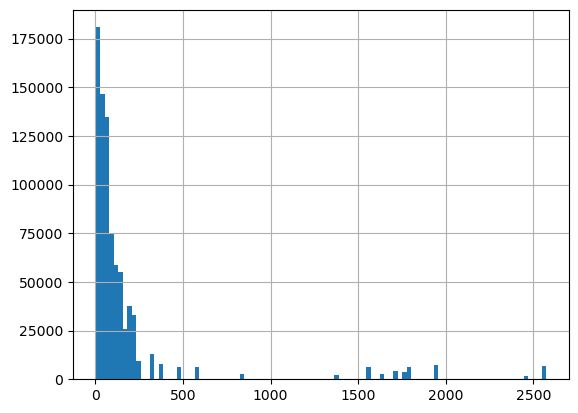

In [8]:
with plt.ioff():
	all_midi_info_df['num_tempo_changes'].hist(bins=100)
	plt.show()

A good number have 500+ tempo changes... Let's look at the max tempo change file:

In [9]:
max_tempo_change_file_idx = all_midi_info_df[all_midi_info_df['num_tempo_changes'] == 2575].file_index.unique()[0]
tmp_tcs = np.array(get_midi_data(all_training_files[max_tempo_change_file_idx]).get_tempo_changes()).T # (time, tempo)
tmp_tcs[:20]

array([[  0.        , 134.00005807],
       [  1.19402933, 119.00016065],
       [  1.40411308, 134.00005807],
       [  2.26232167, 119.00016065],
       [  2.76652267, 130.00013   ],
       [  2.80498417, 131.00007642],
       [  2.91948792, 132.000132  ],
       [  2.99524542, 134.00005807],
       [  3.21912592, 135.000135  ],
       [  3.25616292, 136.00014507],
       [  3.36645692, 138.0001932 ],
       [  3.40268875, 139.00021777],
       [  3.51060225, 141.00030315],
       [  3.616985  , 142.000071  ],
       [  3.65219625, 143.000143  ],
       [  3.68716125, 144.0002304 ],
       [  3.79132775, 146.0003212 ],
       [  3.89406725, 147.00009555],
       [  3.92808083, 149.0002086 ],
       [  3.96163783, 150.        ]])

Ah, okay. I see it's because of slowly increasing/decreasing tempo.
I wish there was a better way to annotate that in MIDI...

I think we just ignore the tempo changes in the data.
Normally I would try both ways, but I think the extreme skewed distribution of tempo changes will make it hard to learn
and there's limited time.

Unique time signatures:
array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 11, 15, 16, 26, 36, 37, 44])


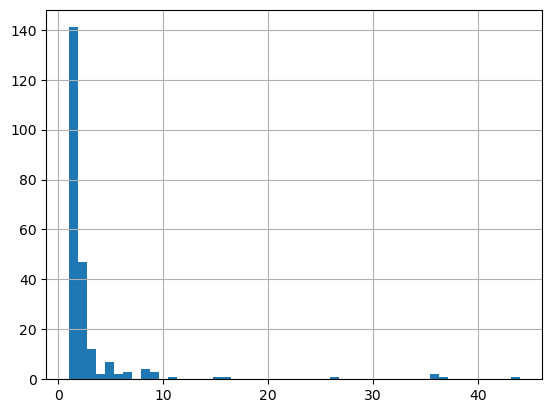

In [10]:
# For key signatures and time signatures, check that all files have this feature

def find_file_from_df(df):
    return f"{df.composer}/{df.file_name}, index {df.file_index}"

print("Unique time signatures:")
pprint(np.sort(all_midi_info_df['num_time_sigs'].unique()))

with plt.ioff():
	all_midi_info_df.groupby(['file_name'])['num_time_sigs'].max().hist(bins=50)
	plt.show()

3 files (same Beethoven piece) were missing time signatures:

- 'Beethoven/Violin Sonata No 7 in C minor_OP30NO2_2572_bevs7c.mid, index 70',
- 'Beethoven/Violin Sonata No 7 in C minor_OP30NO2_2571_bevs7b.mid, index 102',
- 'Beethoven/Violin Sonata No 7 in C minor_OP30NO2_2573_bevs7d.mid, index 189']

I looked it up and this piece is entirely 4/4, so I modified the files with the following code:

In [11]:
# (this does nothing after already changing the files)
time_signature = pm.TimeSignature(4, 4, 0.0) # 4/4
missing_time_sig_idxs = all_midi_info_df[all_midi_info_df['num_time_sigs'] == 0].file_index.unique()
for idx in missing_time_sig_idxs:
	all_midi_info_df.loc[all_midi_info_df['file_index'] == idx, 'time_sig'] = '4/4'
	all_midi_info_df.loc[all_midi_info_df['file_index'] == idx, 'num_time_sigs'] = 1
	# Write MIDI data back to file
	ts_midi_data = get_midi_data(all_training_files[idx])
	ts_midi_data.time_signature_changes = [time_signature]
	with open(all_training_files[idx], 'wb') as fd:
		ts_midi_data.write(fd)

Unique key signatures:
array(['Eb Major', nan, 'C Major', 'Bb Major', 'Ab Major', 'G Major',
       'E Major', 'D Major', 'E minor', 'G minor', 'D minor', 'F Major',
       'Gb Major', 'B Major', 'A Major', 'Db Major', 'A minor'],
      dtype=object)
And at least one file with no key signatures... (nan)


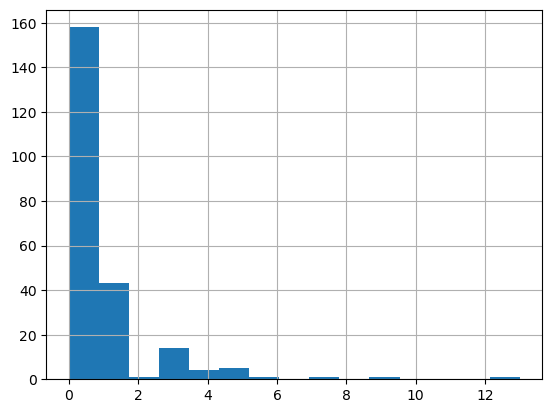

In [12]:
print("Unique key signatures:")
pprint(all_midi_info_df['key_sig'].unique())
print("And at least one file with no key signatures... (nan)")
with plt.ioff():
	all_midi_info_df.groupby(['file_name'])['num_key_sigs'].max().hist(bins=15)
	plt.show()

Okay, so most files don't have key signatures. We'll ignore this feature too.

**So the features will be:**
- the composition itself (as a generated piano roll image with normalized velocity values for luminance)
- number of instruments
- number of time signature changes


## Visualize data

num pixels: 464128


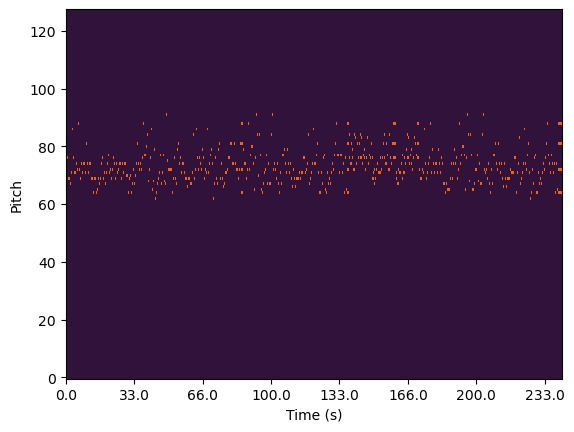

In [13]:
def plot_midi_data(midi_data, fs=15, save_fig=False):
	"""Plot a piano roll image of the MIDI data"""
	piano_roll = midi_data.get_piano_roll(fs=fs)
	piano_roll = np.flipud(piano_roll)
	num_pixels = piano_roll.size
	print(f"num pixels: {num_pixels}")
	with plt.ioff():
		fig = plt.imshow(piano_roll, cmap='turbo', aspect='auto', interpolation='none', vmin=0, vmax=127)
		plt.ylabel('Pitch')
		plt.gca().invert_yaxis()
		plt.xlabel('Time (s)')
		locs, labels = plt.xticks()
		plt.xticks(locs, [x//fs for x in locs])
		_xlim = plt.xlim()
		plt.xlim(0, piano_roll.shape[1])

		if save_fig:
			# Turn off axis for saving
			plt.axis('off')
			fig.axes.get_xaxis().set_visible(False)
			fig.axes.get_yaxis().set_visible(False)
			plt.savefig('test_midi.png', bbox_inches='tight', pad_inches=0)
		plt.show()

plot_midi_data(midi_data)

In [14]:
ipd.Audio(midi_data.synthesize(fs=16000), rate=16000)

## Data preparation

We will next load the piano roll array, and add the number of instruments and
time signatures as extra channels.

In [15]:
def chunk_midi_data(midi_data: pm.PrettyMIDI,
					chunk_gap: float = 5.0,
					fs: int = 25) -> T.List[np.array]:
	"""
	Splits a PrettyMIDI object into multiple piano roll arrays with a gap of `chunk_gap` seconds between each chunk.

	Args
	----
	midi_data: pm.PrettyMIDI
		The midi data to chunk
	chunk_gap: int
		The gap between each chunk in seconds
	fs: int
		The sampling rate of the midi data for piano roll generation

	Returns
	-------
	T.List[np.array]
		A list of PrettyMIDI objects
	"""
	# Get the piano roll
	piano_roll = midi_data.get_piano_roll(fs=fs).reshape(128, -1, 1)
	roll_shape = piano_roll.shape

	# Add the extra info as channels
	extra_info_scalars = [
		len(midi_data.instruments), # num_instruments
		len(midi_data.time_signature_changes), # num_time_sig_changes
	]
	for s in extra_info_scalars:
		# NOTE: we can save memory by adding these channels dynamically during batching
		piano_roll = np.concatenate([piano_roll, np.ones(roll_shape) * s], axis=2)  # add channel
	piano_roll = piano_roll.astype(np.int16)

	# Get the indexing vars
	chunk_gap_offset = int(np.ceil(fs * chunk_gap))
	last_chunk_idx = piano_roll.shape[1] - (piano_roll.shape[1] % chunk_gap_offset)

	# Split into chunks
	out_chunks = []
	for chunk_idx in range(0, last_chunk_idx, chunk_gap_offset):
		chunk = piano_roll[:, chunk_idx:chunk_idx + chunk_gap_offset, :]
		out_chunks.append(chunk)
	return out_chunks


In [16]:
training_filename = "training_data.npy"
labels_filename = "training_labels.npy"
training_file_chunks_filename = "training_filenames.npy"
if os.path.exists(training_filename) and os.path.exists(labels_filename) and os.path.exists(training_file_chunks_filename):
	with open(training_filename, 'rb') as fd:
		training_data = np.load(fd)
		training_labels = np.load(labels_filename)
		training_file_chunks = np.load(training_file_chunks_filename)
else:
	all_training_chunks = []
	all_training_labels = []
	all_training_filename_chunks = []
	for i,f in enumerate(tqdm(all_training_files)):
		midi_data = get_midi_data(f)
		chunks = chunk_midi_data(midi_data)
		all_training_chunks.extend(chunks)
		all_training_labels.extend([f.parent.name] * len(chunks))
		all_training_filename_chunks.extend([f.name] * len(chunks))

	print("Training chunks:", len(all_training_chunks))
	training_data = np.stack(all_training_chunks, axis=0)
	np.save(training_filename, training_data)
	training_labels = np.array(all_training_labels)
	np.save(labels_filename, training_labels)
	training_file_chunks = np.array(all_training_filename_chunks)
	np.save(training_file_chunks_filename, training_file_chunks)

# Do same for testing data

testing_filename = "testing_data.npy"
test_file_chunks_filename = "testing_filenames.npy"
if os.path.exists(testing_filename) and os.path.exists(test_file_chunks_filename):
	with open(testing_filename, 'rb') as fd:
		testing_data = np.load(fd)
		testing_file_chunks = np.load(test_file_chunks_filename)
else:
	all_testing_chunks = []
	all_testing_filename_chunks = []
	for i,f in enumerate(tqdm(test_files)):
		midi_data = get_midi_data(f)
		chunks = chunk_midi_data(midi_data)
		all_testing_chunks.extend(chunks)
		all_testing_filename_chunks.extend([f.name] * len(chunks))

	print("Testing chunks:", len(all_testing_chunks))
	testing_data = np.stack(all_testing_chunks, axis=0)
	np.save(testing_filename, testing_data)
	testing_file_chunks = np.array(all_testing_filename_chunks)
	np.save(test_file_chunks_filename, testing_file_chunks)


In [17]:
print("training data shape =",training_data.shape)
print("training data dtype =",training_data.dtype)
print()

print("labels shape =", training_labels.shape)
print("labels dtype =", training_labels.dtype)
print("unique labels =", np.unique(training_labels))
print()

print("testing data shape =",testing_data.shape)
print("testing data dtype =",testing_data.dtype)

training data shape = (14400, 128, 125, 3)
training data dtype = int16

labels shape = (14400,)
labels dtype = <U9
unique labels = ['Bach' 'Beethoven' 'Brahms' 'Schubert']

testing data shape = (1918, 128, 125, 3)
testing data dtype = int16


In [18]:
# Use these for normalizing the data

max_velocity = max(training_data[..., 0].max(), testing_data[..., 0].max())
max_num_instruments = max(training_data[..., 1].max(), testing_data[..., 1].max())
max_num_time_sigs = max(training_data[..., 2].max(), testing_data[..., 2].max())
value_maxes = [max_velocity, max_num_instruments, max_num_time_sigs]
print("max velocity =", max_velocity)
print("max num instruments =", max_num_instruments)
print("max num time sigs =", max_num_time_sigs)

max velocity = 440
max num instruments = 13
max num time sigs = 44


In [19]:
class MidiDataset(Dataset):
	def __init__(self, data: np.array, labels: np.array, filenames: np.array, normalize: bool = True):
		assert len(data) == len(labels)

		self.data = data.astype(np.float32).transpose((0, 3, 1, 2)) # convert to NCHW format (PyTorch default)
		self.composers = np.unique(labels)
		self.labels = np.array([self.composers.tolist().index(x) for x in labels]) # convert to ints
		self.filenames = filenames

		self.normalize = normalize
		if normalize:
			# normalize by each feature dimension separately (i.e. each channel)
			for i in range(self.data.shape[1]):
				self.data[..., i] = self.data[..., i] / value_maxes[i]

	def __len__(self):
		return len(self.data)

	def __getitem__(self, idx):
		return self.data[idx], self.labels[idx], self.filenames[idx] # return the data, label, and filename

class MidiDataLoader(DataLoader):
	def __init__(self, data: np.array, labels, batch_size: int = 32, shuffle: bool = True, num_workers: int = 4):
		super().__init__(MidiDataset(data, labels, training_file_chunks), batch_size=batch_size, shuffle=shuffle,
		                 num_workers=num_workers)

In [20]:
train_dataloader = MidiDataLoader(training_data, training_labels)

## Define CNN model and train

In [21]:
# convolutional neural network with 3 channels using batch norm and max pooling
class MidiConvNet(nn.Module):

	def __init__(self, num_classes: int = 4, channels: int = 3):
		super().__init__()
		self.num_classes = num_classes

		self.conv1 = nn.Conv2d(channels, channels * 2, kernel_size=3, stride=1, padding=2)
		self.bn1 = nn.BatchNorm2d(channels * 2)
		self.pool1 = nn.MaxPool2d(2)
		self.conv2 = nn.Conv2d(channels * 2, channels * 4, kernel_size=3, stride=1, padding=2)
		self.bn2 = nn.BatchNorm2d(channels * 4)
		self.pool2 = nn.MaxPool2d(2)
		self.conv3 = nn.Conv2d(channels * 4, channels * 2, kernel_size=3, stride=1, padding=1)
		self.bn3 = nn.BatchNorm2d(channels * 2)
		self.pool3 = nn.MaxPool2d(2)
		self.conv4 = nn.Conv2d(channels * 2, channels, kernel_size=3, stride=1, padding=1)
		self.bn4 = nn.BatchNorm2d(channels)
		self.pool4 = nn.MaxPool2d(2)
		self.conv5 = nn.Conv2d(channels, channels, kernel_size=3, stride=1, padding=1)
		self.linear_out = nn.Linear(3*8*8, num_classes)


	def forward(self, x):
		x = self.pool1(F.relu(self.bn1(self.conv1(x))))
		x = self.pool2(F.relu(self.bn2(self.conv2(x))))
		x = self.pool3(F.relu(self.bn3(self.conv3(x))))
		x = self.pool4(F.relu(self.bn4(self.conv4(x))))
		x = self.conv5(x)
		# print(x.shape)
		x = self.linear_out(x.reshape(x.shape[0], -1))
		return x

In [22]:
# Set loss function as cross entropy, weighted by class frequency (composer in dataset)
unique_labels = np.unique(training_labels)
print(unique_labels)
class_weights = compute_class_weight(
	class_weight='balanced',
	classes=unique_labels,
	y=training_labels
)
class_weights = th.tensor(class_weights, dtype=th.float32).cuda()
print(class_weights)
loss = nn.CrossEntropyLoss(weight=class_weights).cuda()

['Bach' 'Beethoven' 'Brahms' 'Schubert']
tensor([5.2709, 0.3714, 1.9272, 1.6690], device='cuda:0')


In [23]:
model = MidiConvNet(num_classes=len(unique_labels), channels=3).cuda()
optimizer = th.optim.Adam(model.parameters(), lr=0.001)

In [24]:

writer = SummaryWriter()
model_path = "model.pt"

if not os.path.exists(model_path):

	global_step = 0
	for epoch in tqdm(range(100)):
		losses = []
		for batch, label, _ in train_dataloader:
			batch = batch.cuda()
			label = label.cuda()
			optimizer.zero_grad()
			output = model(batch)
			loss_val = loss(output, label)
			loss_val.backward()
			losses.append(loss_val.item())
			writer.add_scalar('Loss/train', loss_val.item(), global_step)
			global_step += 1
			optimizer.step()
		epoch_loss = np.mean(losses)
		print("Epoch", epoch, "loss:", epoch_loss)
		writer.add_scalar('Loss/epoch', epoch_loss, epoch)

	# save the model
	th.save(model.state_dict(), "model.pt")

else:
	model.load_state_dict(th.load(model_path)) # load the model

## Evaluate model on test set

Now we evaluate the trained model on the test set and visualize the mean losses in a histogram.

The goal is to identify a boundary in the loss to use as a threshold.

So what loss do we use?
We don't have the true label for cross entropy loss, and it could be none of them.

I'm going to use regular entropy to compute the imbalance of the output distribution.
The idea is that if the output distribution is very imbalanced, then the model is very confident in its prediction.
If the output distribution is very balanced, then the model is not confident in its prediction,
and it's likely an unknown class.

In [25]:

# test_dataloader = MidiDataLoader(testing_data, testing_labels, batch_size=1)
test_dataset = MidiDataset(testing_data, np.zeros(len(testing_data)), testing_file_chunks)
test_dataloader = DataLoader(test_dataset, batch_size=1, # len(test_dataset),
                             shuffle=True, num_workers=4)

In [26]:
entropy_list = []
filename_list = []
for batch, _, filename in test_dataloader:
	batch = batch.cuda()
	filename_list.append(filename[0])
	output_probs = F.softmax(model(batch))
	distr = Categorical(probs=output_probs)
	entropy = distr.entropy()
	entropy_list.append(entropy.item())

/tmp/ipykernel_52063/139974508.py:6: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output_probs = F.softmax(model(batch))


In [27]:
# Make dataframe to inspect results visually
entropy_df = pd.DataFrame({
	"filename": filename_list,
	"entropy": entropy_list
})

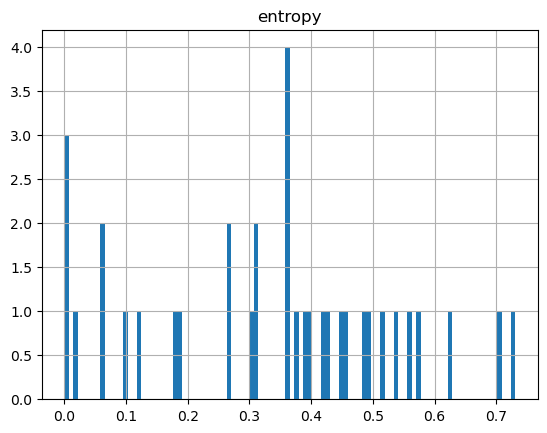

In [28]:
with plt.ioff():
	entropy_df.groupby("filename").mean().hist(bins=100)
	plt.show()

None of the values look *clearly* separable honestly...

But if I'm choosing, the two on the right stand out to me the most.
These files are
- "0.10222964826466285_adj.mid"
- "0.3620067189216978_adj.mid"

There's clearly a ton of more work that could be done to diagnose and improve.

In [29]:
entropy_df.groupby("filename").mean().sort_values(by="entropy", ascending=False).head(10)


,entropy
filename,
0.10222964826466285_adj.mid,0.730924
0.3620067189216978_adj.mid,0.704506
0.647959423719129_adj.mid,0.623531
0.8014751784512073_adj.mid,0.570737
0.3334293069825759_adj.mid,0.557678
0.7491289879531658_adj.mid,0.534460
0.1960551158929671_adj.mid,0.514433
0.23120017256495873_adj.mid,0.490899
0.26551079719260606_adj.mid,0.486164
